In [17]:
#Importing important libraries for clearing and pre-processing
import pandas as pd
import numpy as np
import nltk
from nltk import word_tokenize
import string

In [ ]:
df = pd.read_csv('email1.csv') #Reading the csv file
df

,Unnamed: 0,file,message
0,0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...
...,...,...,...
9995,9995,bass-e/_sent_mail/1047.,Message-ID: <21376194.1075854731510.JavaMail.e...
9996,9996,bass-e/_sent_mail/1048.,Message-ID: <2401643.1075854731531.JavaMail.ev...
9997,9997,bass-e/_sent_mail/1049.,Message-ID: <32002412.1075854731553.JavaMail.e...
9998,9998,bass-e/_sent_mail/105.,Message-ID: <21429983.1075854709202.JavaMail.e...


In [ ]:
df.pop('Unnamed: 0') #Dropping off the unnecessary column


0          0
1          1
2          2
3          3
4          4
        ... 
9995    9995
9996    9996
9997    9997
9998    9998
9999    9999
Name: Unnamed: 0, Length: 10000, dtype: int64

In [ ]:
df

,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...
...,...,...
9995,bass-e/_sent_mail/1047.,Message-ID: <21376194.1075854731510.JavaMail.e...
9996,bass-e/_sent_mail/1048.,Message-ID: <2401643.1075854731531.JavaMail.ev...
9997,bass-e/_sent_mail/1049.,Message-ID: <32002412.1075854731553.JavaMail.e...
9998,bass-e/_sent_mail/105.,Message-ID: <21429983.1075854709202.JavaMail.e...


In [ ]:
def parse_raw_message(raw_message): #Function to split the main message from the email headers(to, from etc)
    lines = raw_message.split('\n') #Splits each line of the email
    email = {}
    message = ''
    # keys_to_extract = ['from', 'to']
    for line in lines: #Looping through each line of the email and we remove the extra space of the text message and attach it to the key 'body' in email dictionary
        if ':' not in line:
            message += line.strip()
            email['body'] = message
        # else:
        #     pairs = line.split(':')
        #     key = pairs[0].lower()
        #     val = pairs[1].strip()
        #     # if key in keys_to_extract:
        #     #     email[key] = val
    return email
    
def map_to_list(emails, key): #Function to append all the text messages gathered into a list
    results = []
    for email in emails:
        if key not in email:
            results.append('')
        else:
            results.append(email[key])
    return results    
    
def parse_into_emails(messages): #Using functions to parsing our Enron set
    emails = [parse_raw_message(message) for message in messages]
    return {
        'body': map_to_list(emails, 'body'), 
        # 'to': map_to_list(emails, 'to'), 
        # 'from_': map_to_list(emails, 'from')
    }

In [ ]:
email_df = pd.DataFrame(parse_into_emails(df.message)) #On applying the function, we get a cleaned dataset
email_df

,body
0,Here is our forecast
1,Traveling to have a business meeting takes the...
2,test successful. way to go!!!
3,"Randy,Can you send me a schedule of the salary..."
4,
...,...
9995,"shes pretty sexy, huh? are we getting togethe..."
9996,i copied your idea - and it screwed up your name!
9997,"---------------------------Eric,Just a reminde..."
9998,did you buy any enron in the 60s?


In [ ]:
email_df.drop(email_df.query(  #Deleting all the empty columns
    "body == ''"
).index, inplace=True)

In [ ]:
email_df. reset_index(inplace=True) #Reseting the index after deleting empty columns

PRE-PROCESSING

In [ ]:
import re #library for simplifying reviews
nltk.download('stopwords') #downloading all the stopwords
from nltk.corpus import stopwords #importing stopwords to our notebook
from nltk.stem.porter import PorterStemmer #Stemming is a process that converts a word to its root eg loved => love, stayed => stay.
# this is necessary to optimise the dimention of the sparse matrix that will be made.
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DiyaK\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
corpus = [] # new list that will contain all the cleaned reviews
corpus1 = []
for i in range(len(email_df)):
    #remove punctuation by replacing all punctuation with space
    # review = re.sub("[^a-zA-z | ^\w+'t ]",'', email_df['body'][i]) #
    # review = re.sub('[0-9]+', '', email_df['body'][i])
    text_nonum = re.sub(r'\d+', '', email_df['body'][i])
    # remove punctuations and convert characters to lower case
    review = "".join([char.lower() for char in text_nonum if char not in string.punctuation])
    
    #transform all capital letters to lower case
    review = review.lower()
    
    #split review to different words to apply stemming
    review = review.split()
    
    #stemming and also ignoring stopwords alongside
    ps = PorterStemmer()
    wordnet = WordNetLemmatizer()
    all_stopwords=stopwords.words('english')
    r_words=['no','not','off','nor',"didn't","isn't","couldn't","haven't",'or',"should've","aren't",
             "couldn","didn","doesn't",'doesn',"don't",'don','hadn',"hadn't",'hasn',"hasn't",'haven',
             'mightn',"mightn't",'mustn',"mustn't","needn't",'needn',"shouldn","shouldn't",'wasn',
             "wasn't","won't","won","wouldn't","because","same",'wouldn','should']
    review = [wordnet.lemmatize(word) for word in review if not word in set(all_stopwords)]
    #joining words together to form a cleaned review
    for j in review:
        corpus.append(j)
    review = ' '.join(review)
    corpus1.append(review)

   

In [ ]:
email_pf = pd.DataFrame(corpus1) #Converting to a DataFrame for better analysing 



In [ ]:
email_pf.rename(columns = {0:'Text'}, inplace = True) #Renaming a column
email_pf

,Text
0,forecast
1,traveling business meeting take fun trip espec...
2,test successful way go
3,randycan send schedule salary level everyone t...
4,greghow either next tuesday thursdayphillip
...,...
9801,shes pretty sexy huh getting together talk eur...
9802,copied idea screwed name
9803,ericjust reminder still need flash detail fina...
9804,buy enron


In [ ]:
from nltk.tokenize import RegexpTokenizer
list = []
for i in range(len(email_pf)):
    list.append(word_tokenize(email_pf['Text'][i]))
email_pf['New']=list   
email_pf
# email_pf.drop(columns=['New1','New'], inplace=True)

,Text,New
0,forecast,[forecast]
1,traveling business meeting take fun trip espec...,"[traveling, business, meeting, take, fun, trip..."
2,test successful way go,"[test, successful, way, go]"
3,randycan send schedule salary level everyone t...,"[randycan, send, schedule, salary, level, ever..."
4,greghow either next tuesday thursdayphillip,"[greghow, either, next, tuesday, thursdayphillip]"
...,...,...
9801,shes pretty sexy huh getting together talk eur...,"[shes, pretty, sexy, huh, getting, together, t..."
9802,copied idea screwed name,"[copied, idea, screwed, name]"
9803,ericjust reminder still need flash detail fina...,"[ericjust, reminder, still, need, flash, detai..."
9804,buy enron,"[buy, enron]"


In [ ]:
email_gf = email_pf.drop(email_pf.index[101:9806], axis=0, inplace=False)
email_gf

,Text,New
0,forecast,[forecast]
1,traveling business meeting take fun trip espec...,"[traveling, business, meeting, take, fun, trip..."
2,test successful way go,"[test, successful, way, go]"
3,randycan send schedule salary level everyone t...,"[randycan, send, schedule, salary, level, ever..."
4,greghow either next tuesday thursdayphillip,"[greghow, either, next, tuesday, thursdayphillip]"
...,...,...
96,checked exercising option smith barney enron k...,"[checked, exercising, option, smith, barney, e..."
97,tried new address dont access also need toente...,"[tried, new, address, dont, access, also, need..."
98,forwarded phillip k allenhouect arnoldhouectec...,"[forwarded, phillip, k, allenhouect, arnoldhou..."
99,coopershould use different address,"[coopershould, use, different, address]"


In [ ]:
email_gf['Text'][11]

'forwarded phillip k allenhouect richard burchfieldphillipbelow issue list go forward documenting therequirements consolidated physicalfinancial position transporttrade capture need focus first bullet allans listthe need single set requirement although meeting keithon wednesday informative solution creating infinitely dynamicconsolidated position screen extremely difficult timeconsuming throughout meeting wednesday keith alluded theinability get consensus amongst trader presentation theconsolidated position solution make trader canarrange position screen liking much like excel need tohappen monday effort design desired layout theconsolidated position screen critical excludebuilding capability create flexible position presentation thefuture order create plan measured need firmrequirements also reiterate goal project projectplan consolidate physicalfinancial position transport trade capturethe issue raised capture project tothemselves need prioritised effort outside thisprojecti involved

In [ ]:
labels = ['none', 'work', 'work', 'work', 'work', 'work', 'work', 'none', 'work', 'work', 'work', 'work', 'work', 'work', 'none', 'work', 'work', 'work', 'work', 'none', 'personal', 'none', 'work', 'work', 'work', 'work', 'work', 'work', 'none', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'personal', 'none', 'none', 'work','work','work','work', 'personal', 'work', 'work', 'work', 'work', 'none', 'work', 'none', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'none', 'none', 'work', 'work', 'none','none', 'none', 'none',  'work', 'none', 'work', 'work', 'none', 'none', 'none', 'none', 'work', 'personal', 'none', 'work', 'personal', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'personal', 'work', 'work', 'none', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'work', 'none', 'work']

In [ ]:
len(labels)

100

In [ ]:
email_gf['labels'] = labels
email_gf

,Text,New,labels
0,forecast,[forecast],none
1,traveling business meeting take fun trip espec...,"[traveling, business, meeting, take, fun, trip...",work
2,test successful way go,"[test, successful, way, go]",work
3,randycan send schedule salary level everyone t...,"[randycan, send, schedule, salary, level, ever...",work
4,greghow either next tuesday thursdayphillip,"[greghow, either, next, tuesday, thursdayphillip]",work
...,...,...,...
96,checked exercising option smith barney enron k...,"[checked, exercising, option, smith, barney, e...",work
97,tried new address dont access also need toente...,"[tried, new, address, dont, access, also, need...",work
98,forwarded phillip k allenhouect arnoldhouectec...,"[forwarded, phillip, k, allenhouect, arnoldhou...",work
99,coopershould use different address,"[coopershould, use, different, address]",none


In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder() 

In [ ]:
email_gf['target'] = encoder.fit_transform(email_gf['labels'])
email_gf

,Text,New,labels,target
0,forecast,[forecast],none,0
1,traveling business meeting take fun trip espec...,"[traveling, business, meeting, take, fun, trip...",work,2
2,test successful way go,"[test, successful, way, go]",work,2
3,randycan send schedule salary level everyone t...,"[randycan, send, schedule, salary, level, ever...",work,2
4,greghow either next tuesday thursdayphillip,"[greghow, either, next, tuesday, thursdayphillip]",work,2
...,...,...,...,...
96,checked exercising option smith barney enron k...,"[checked, exercising, option, smith, barney, e...",work,2
97,tried new address dont access also need toente...,"[tried, new, address, dont, access, also, need...",work,2
98,forwarded phillip k allenhouect arnoldhouectec...,"[forwarded, phillip, k, allenhouect, arnoldhou...",work,2
99,coopershould use different address,"[coopershould, use, different, address]",none,0


In [ ]:
email_gf.drop(columns = ['New'], inplace=True)

In [ ]:
email_gf.isnull().sum()

Text      0
labels    0
target    0
dtype: int64

In [ ]:
email_gf

,Text,labels,target
0,forecast,none,0
1,traveling business meeting take fun trip espec...,work,2
2,test successful way go,work,2
3,randycan send schedule salary level everyone t...,work,2
4,greghow either next tuesday thursdayphillip,work,2
...,...,...,...
96,checked exercising option smith barney enron k...,work,2
97,tried new address dont access also need toente...,work,2
98,forwarded phillip k allenhouect arnoldhouectec...,work,2
99,coopershould use different address,none,0


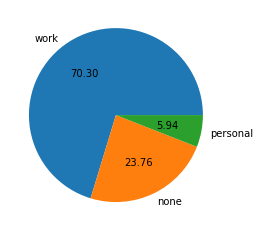

In [ ]:
import matplotlib.pyplot as plt
plt.pie(email_gf['target'].value_counts(), labels=['work','none', 'personal'], autopct = "%0.2f")
plt.show()

In [ ]:
%pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [ ]:
from wordcloud import WordCloud
text = email_gf['Text']
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')



NameError: name 'email_gf' is not defined

In [ ]:
wc.generate(email_gf[email_gf['target'] == 1]['Text'].str.cat(sep = " "))

NameError: name 'email_gf' is not defined

In [ ]:
print(corpus)

['forecast', 'traveling', 'business', 'meeting', 'take', 'fun', 'trip', 'especially', 'prepare', 'presentation', 'would', 'suggest', 'holding', 'business', 'plan', 'meeting', 'take', 'trip', 'without', 'formal', 'business', 'meeting', 'would', 'even', 'try', 'get', 'honest', 'opinion', 'whether', 'trip', 'even', 'desired', 'necessaryas', 'far', 'business', 'meeting', 'think', 'would', 'productive', 'try', 'stimulate', 'discussion', 'across', 'different', 'group', 'working', 'often', 'presenter', 'speaks', 'others', 'quiet', 'waiting', 'turn', 'meeting', 'might', 'better', 'held', 'round', 'table', 'discussion', 'formatmy', 'suggestion', 'go', 'austin', 'play', 'golf', 'rent', 'ski', 'boat', 'jet', 'ski', 'flying', 'somewhere', 'take', 'much', 'time', 'test', 'successful', 'way', 'go', 'randycan', 'send', 'schedule', 'salary', 'level', 'everyone', 'thescheduling', 'group', 'plus', 'thought', 'change', 'need', 'madepatti', 'examplephillip', 'greghow', 'either', 'next', 'tuesday', 'thursd

In [ ]:
total = set(corpus)
print(total)


{'shootmeet', 'milliontons', 'advicestephen', 'fhrerlegislated', 'wpa', 'unlessof', 'communicationsjeffwhats', 'blanchedfaces', 'fiscals', 'dpctodays', 'yeartoyear', 'widthtdtrmap', 'productsplease', 'utilityconnections', 'jackpot', 'abramoenronjohn', 'declinesince', 'rightinstead', 'nationalist', 'processing', 'willreschedule', 'groupenron', 'strategiesoutlined', 'asone', 'catabay', 'saysustainable', 'sizenbspfontsupbrrates', 'butlerdiscusses', 'nutcrackerclick', 'relied', 'deskweek', 'anycomputergunther', 'themthanks', 'seng', 'rightinto', 'elliottenronenronxgate', 'aefas', 'greghere', 'belowcap', 'ebsplease', 'dignus', 'physicalfinancail', 'armani', 'columnista', 'gasprojects', 'enersenbarry', 'attendingjohn', 'biggestforeign', 'worthlessgranting', 'attraditions', 'reelingby', 'rfb', 'phonethe', 'actordirector', 'hourahead', 'ebsmay', 'mario', 'reportersare', 'subcabinet', 'hrefindexemailfilesfilelistxmltitlepower', 'coinvestments', 'companyandy', 'expansionmsn', 'tradesthanksregard

In [ ]:
from nltk.probability import FreqDist
fdist = FreqDist() #Importing frequency function to check the frequency of each word occuring in the emails

In [ ]:
for word in corpus1: #Looping through each mail to get the total count of the frequency of words
    fdist[word] += 1
fdist    


FreqDist({'georgehuanenroncom mikemaggienroncom larrymayenroncomhalmckinneyenroncom errolmclaughlinenroncomdutchquigleyenroncom seanriordanenroncomjoeytaylorenroncom danthibautenroncom': 46, 'attached please find natural gas market analysis todaythanksbob mckinney nat gasdoc': 29, 'forwarded phillip k allenhouect': 26, 'information contained herein based source believe bereliable represent accurate complete nothingcontained herein considered offer sell solicitationof offer buy financial instrument discussed herein anyopinions expressed herein solely author theymay differ material respect expressed published byon behalf carr future officer director employee oraffiliates carr futuresthe chart available web clicking hot linkscontained email reason unable receive thecharts via web please contact via email email chartsto attachmentsnat gas strip matrixnat gas spread matrixcrude product spread matrixcarr future wacker dr suite chicago il usasoblandercarrfutcom': 26, 'forwarded phillip k alle

In [ ]:
for word in corpus: #Frequency of each word in the mails
    fdist[word] += 1
fdist 

FreqDist({'enron': 6475, 'company': 5319, 'would': 4721, 'market': 4024, 'email': 3800, 'gas': 3762, 'please': 3751, 'price': 3497, 'said': 3486, 'power': 3312, ...})